<a href="https://colab.research.google.com/github/pranay8297/deep-learning-projects/blob/master/lesson_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install diffusers
!pip install transformers
!pip install ipdb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 61.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 42.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 65.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.4 MB/s eta 0:00:00


In [2]:
from torch import autocast
from ipdb import set_trace as st
from tqdm import tqdm

In [4]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
notebook_login()

# Latents and Callbacks

In [4]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [5]:
?? pipe

In [6]:
vae = pipe.vae
images = []

def latents_callback(i, t, latents):
    latents = 1 / 0.18215 * latents
    image = vae.decode(latents).sample[0]
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(1, 2, 0).numpy()
    images.extend(pipe.numpy_to_pil(image))

In [5]:
prompt = "Portrait painting of Jeremy Howard looking happy."
torch.manual_seed(9000)
final_image = pipe(prompt, callback = latents_callback, callback_steps = 12).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

In [6]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

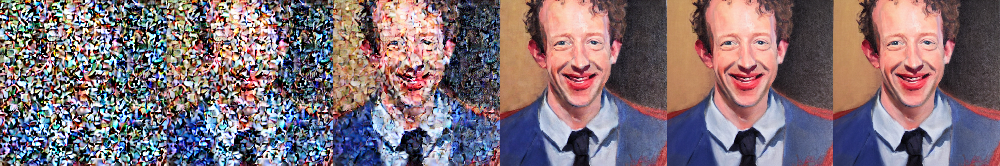

In [8]:
images.append(final_image)
image_grid(images, 1, len(images))

In [9]:
del pipe

# Inside Pipeline

In [5]:
from transformers import CLIPTextModel, CLIPTokenizer

In [7]:
device = torch.device('cuda', 0) if torch.cuda.is_available() else torch.device('cpu')

In [6]:
# P1 - Text encoder and Tokenizer
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to('cuda')

In [10]:
# P2 - VAE - Both Encoder and Decoder
from diffusers import AutoencoderKL
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema", torch_dtype = torch.float16).to("cuda")

In [8]:
# P3 - UNET
from diffusers import UNet2DConditionModel
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder = "unet", torch_dtype = torch.float16).to("cuda")

In [9]:
# P4 - Noise Scheduler - LMS Noise Scheduler
from diffusers import LMSDiscreteScheduler
beta_start, beta_end = 0.00085,0.012
scheduler = LMSDiscreteScheduler(beta_start = beta_start, beta_end = beta_end, beta_schedule = "scaled_linear", num_train_timesteps = 1000)

# IMAGE GENERATION PIPELINE

In [25]:
# Now that all the required units are present, lets start building the code.

In [13]:
scheduler

LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.20.0",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "steps_offset": 0,
  "timestep_spacing": "linspace",
  "trained_betas": null,
  "use_karras_sigmas": false
}

In [14]:
prompt = ["a photograph of an astronaut riding a horse"]

height = 512
width = 512
num_inference_steps = 70
guidance_scale = 7.5
batch_size = 1

In [15]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_input

{'input_ids': tensor([[49406,   320,  8853,   539,   550, 18376,  6765,   320,  4558, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [16]:
tokenizer.decode(320), tokenizer.decode(49407)

('a', '<|endoftext|>')

In [17]:
text_embeddings = text_encoder(text_input['input_ids'].to('cuda'))[0].half()
text_embeddings.shape, text_embeddings

(torch.Size([1, 77, 768]),
 tensor([[[-0.3884,  0.0229, -0.0523,  ..., -0.4902, -0.3066,  0.0674],
          [ 0.0292, -1.3242,  0.3076,  ..., -0.5254,  0.9766,  0.6655],
          [ 0.4609,  0.5610,  1.6689,  ..., -1.9502, -1.2266,  0.0093],
          ...,
          [-3.0410, -0.0674, -0.1777,  ...,  0.3950, -0.0174,  0.7671],
          [-3.0566, -0.1058, -0.1936,  ...,  0.4258, -0.0184,  0.7588],
          [-2.9844, -0.0850, -0.1726,  ...,  0.4373,  0.0092,  0.7490]]],
        device='cuda:0', dtype=torch.float16, grad_fn=<NativeLayerNormBackward0>))

In [18]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
# uncond_input.input_ids.shape
uncond_embeddings = text_encoder(uncond_input.input_ids.to('cuda'))[0].half()
uncond_embeddings.shape, uncond_embeddings

(torch.Size([1, 77, 768]),
 tensor([[[-0.3884,  0.0229, -0.0523,  ..., -0.4902, -0.3066,  0.0674],
          [-0.3718, -1.4502, -0.3403,  ...,  0.9492,  0.1862, -1.1016],
          [-0.5112, -1.4619, -0.2927,  ...,  1.0410,  0.0698, -1.0283],
          ...,
          [ 0.4998, -0.9565, -0.6621,  ...,  1.6006, -1.0625, -0.2192],
          [ 0.4983, -0.9473, -0.6631,  ...,  1.6475, -1.0859, -0.2098],
          [ 0.4919, -0.8145, -0.4919,  ...,  1.6104, -1.0176, -0.2484]]],
        device='cuda:0', dtype=torch.float16, grad_fn=<NativeLayerNormBackward0>))

In [19]:
embeddings = torch.cat([uncond_embeddings, text_embeddings], dim = 0)

In [20]:
torch.manual_seed(100)
# Noise Generation and using that noise as latent input
latents = torch.randn((batch_size, unet.config.in_channels, height // 8, width // 8))
latents = latents.to("cuda").half()
latents.shape

torch.Size([1, 4, 64, 64])

In [21]:
scheduler.set_timesteps(num_inference_steps)

In [22]:
latents

tensor([[[[ 0.1268,  1.3564,  0.5630,  ..., -0.8042, -0.6245, -0.5884],
          [ 1.6699, -0.9272, -0.9761,  ...,  2.3848, -0.0355, -0.3179],
          [ 0.3579, -1.7842, -0.3052,  ...,  0.4880, -2.5781,  1.0010],
          ...,
          [-0.2581, -0.1572,  0.3728,  ...,  0.7891, -2.3125,  0.6992],
          [-0.3269, -2.0801, -0.1058,  ...,  0.3193,  0.4995,  0.6387],
          [-0.3411, -0.0660,  0.4670,  ..., -1.9307, -0.8501, -1.0293]],

         [[-0.0521, -1.7852,  0.6538,  ...,  2.8867,  0.7246, -1.3223],
          [-0.3638,  1.0967, -0.1370,  ..., -0.0730, -0.6479, -0.3733],
          [-1.0547, -0.4634, -0.9062,  ...,  0.9658,  1.4824,  0.8320],
          ...,
          [ 0.0346, -1.1777, -0.1742,  ..., -2.3242,  1.1709,  0.3313],
          [ 1.5361, -0.5063,  0.7021,  ...,  1.6309,  0.0281,  0.5093],
          [ 0.5698,  1.4639, -1.6094,  ...,  0.2278, -0.8862,  0.3357]],

         [[ 1.3047,  1.0596, -0.5610,  ...,  3.4434,  0.4841, -0.1908],
          [-1.2568,  0.9170, -

In [23]:
latents = latents * scheduler.init_noise_sigma
latents

tensor([[[[  1.8535,  19.8281,   8.2266,  ..., -11.7500,  -9.1250,  -8.6016],
          [ 24.4062, -13.5547, -14.2656,  ...,  34.8438,  -0.5190,  -4.6445],
          [  5.2305, -26.0781,  -4.4609,  ...,   7.1328, -37.6875,  14.6328],
          ...,
          [ -3.7715,  -2.2969,   5.4492,  ...,  11.5312, -33.7812,  10.2188],
          [ -4.7773, -30.4062,  -1.5469,  ...,   4.6680,   7.3008,   9.3359],
          [ -4.9844,  -0.9653,   6.8242,  ..., -28.2188, -12.4219, -15.0391]],

         [[ -0.7612, -26.0938,   9.5547,  ...,  42.1875,  10.5938, -19.3281],
          [ -5.3164,  16.0312,  -2.0020,  ...,  -1.0664,  -9.4688,  -5.4570],
          [-15.4141,  -6.7734, -13.2422,  ...,  14.1172,  21.6719,  12.1562],
          ...,
          [  0.5059, -17.2188,  -2.5449,  ..., -33.9688,  17.1094,   4.8438],
          [ 22.4531,  -7.3984,  10.2578,  ...,  23.8281,   0.4111,   7.4414],
          [  8.3281,  21.3906, -23.5156,  ...,   3.3281, -12.9531,   4.9062]],

         [[ 19.0625,  15.4844,

In [55]:
scheduler.init_noise_sigma

tensor(14.6146)

In [56]:
scheduler.timesteps, scheduler.sigmas

(tensor([999.0000, 984.5217, 970.0435, 955.5652, 941.0870, 926.6087, 912.1304,
         897.6522, 883.1739, 868.6957, 854.2174, 839.7391, 825.2609, 810.7826,
         796.3043, 781.8261, 767.3478, 752.8696, 738.3913, 723.9130, 709.4348,
         694.9565, 680.4783, 666.0000, 651.5217, 637.0435, 622.5652, 608.0870,
         593.6087, 579.1304, 564.6522, 550.1739, 535.6957, 521.2174, 506.7391,
         492.2609, 477.7826, 463.3043, 448.8261, 434.3478, 419.8696, 405.3913,
         390.9130, 376.4348, 361.9565, 347.4783, 333.0000, 318.5217, 304.0435,
         289.5652, 275.0870, 260.6087, 246.1304, 231.6522, 217.1739, 202.6957,
         188.2174, 173.7391, 159.2609, 144.7826, 130.3043, 115.8261, 101.3478,
          86.8696,  72.3913,  57.9130,  43.4348,  28.9565,  14.4783,   0.0000],
        dtype=torch.float64),
 tensor([14.6146, 13.3974, 12.3033, 11.3184, 10.4301,  9.6279,  8.9020,  8.2443,
          7.6472,  7.1044,  6.6102,  6.1594,  5.7477,  5.3709,  5.0258,  4.7090,
          4.4178,

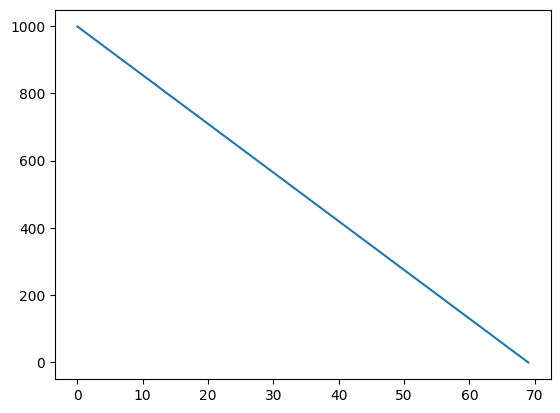

In [58]:
plt.plot(scheduler.timesteps)

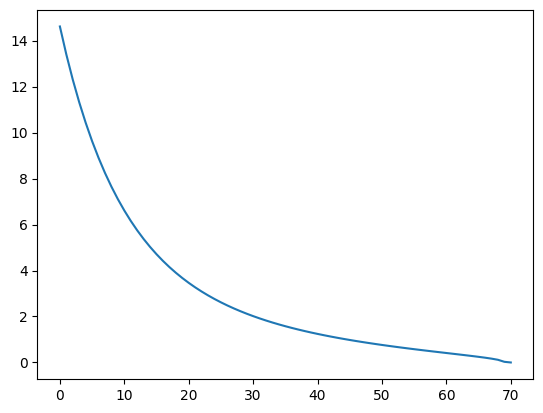

In [59]:
plt.plot(scheduler.sigmas)

In [61]:
from ipdb import set_trace as st

In [62]:
?? scheduler.scale_model_input

In [63]:
?? scheduler.step

In [65]:
?? unet.forward

In [24]:
from tqdm.auto import tqdm

for i, t in enumerate(tqdm(scheduler.timesteps)):
  # Get the input, both unconditional nouse and generated noise which are same
  input = torch.cat([latents] * 2)

  # Scale the nouse
  input = scheduler.scale_model_input(input, t)
  # Predict the noise
  with torch.no_grad():
    pred_noise = unet(input, t, encoder_hidden_states = embeddings).sample

  pred_uncond, pred_text = pred_noise.chunk(2)
  pred = pred_uncond + guidance_scale * (pred_text - pred_uncond)

  # The following line computs: latents - sigma * pred and 2 other steps
  latents = scheduler.step(pred, t, latents).prev_sample

  0%|          | 0/70 [00:00<?, ?it/s]

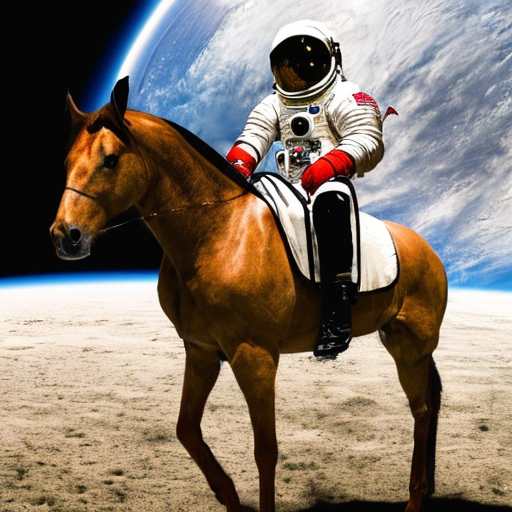

In [25]:
with torch.no_grad(): image = vae.decode(1 / 0.18215 * latents).sample
image = (image / 2 + 0.5).clamp(0, 1)
image = image[0].detach().cpu().permute(1, 2, 0).numpy()
image = (image * 255).round().astype("uint8")
Image.fromarray(image)

WITH MULTIPLE PROMPTS AS A BATCH

In [26]:
prompts = [
    'a photograph of an astronaut riding a horse',
    'an oil painting of an astronaut riding a horse in the style of grant wood'
]

In [27]:
# P1 - Encode the text
text_input = tokenizer(prompts, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_embeddings = text_encoder(text_input['input_ids'].to('cuda')).last_hidden_state.half()

In [28]:
text_embeddings.shape

torch.Size([2, 77, 768])

In [29]:
# P2 - Uncond Embeddings
uncond_input = tokenizer(['']*len(prompts), padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input['input_ids'].to('cuda')).last_hidden_state.half()

In [30]:
uncond_embeddings.shape

torch.Size([2, 77, 768])

In [31]:
embeddings = torch.cat([uncond_embeddings, text_embeddings], dim = 0)
embeddings.shape

torch.Size([4, 77, 768])

In [32]:
torch.manual_seed(100)

In [33]:
# P3 - Create noisy latents for
latents = torch.randn((len(prompts), unet.config.in_channels, height//8, width//8)).half().to('cuda')
scheduler.set_timesteps(num_inference_steps)
latents = latents * scheduler.init_noise_sigma

In [34]:
torch.cat([latents]*2).shape

torch.Size([4, 4, 64, 64])

In [35]:
g = guidance_scale

In [36]:
for i,ts in enumerate(tqdm(scheduler.timesteps)):
    inp = scheduler.scale_model_input(torch.cat([latents] * 2), ts)

    with torch.no_grad(): u,t = unet(inp, ts, encoder_hidden_states=embeddings).sample.chunk(2)
    pred = u + g*(t-u)
    latents = scheduler.step(pred, ts, latents).prev_sample

  0%|          | 0/70 [00:00<?, ?it/s]

In [37]:
with torch.no_grad(): image = vae.decode(1 / 0.18215 * latents).sample
res = (image / 2 + 0.5).clamp(0, 1)

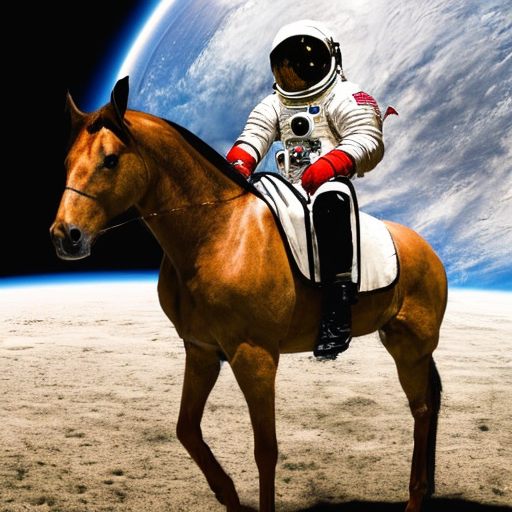

In [38]:
image = res[0].detach().cpu().permute(1, 2, 0).numpy()
image = (image * 255).round().astype("uint8")
Image.fromarray(image)

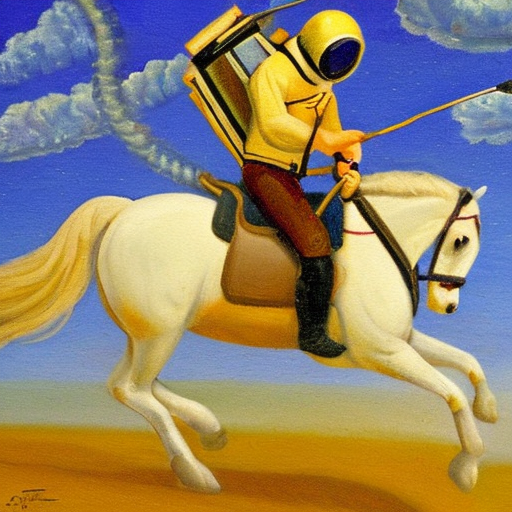

In [39]:
image = res[1].detach().cpu().permute(1, 2, 0).numpy()
image = (image * 255).round().astype("uint8")
Image.fromarray(image)


# OWN EXPERIMENTS

In [57]:
prompts = [
    'a photograph of an astronaut riding a horse',
]

# P1 - Encode the text
text_input = tokenizer(prompts, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_embeddings = text_encoder(text_input['input_ids'].to('cuda')).last_hidden_state.half()

# # P2 - Uncond Embeddings
# uncond_input = tokenizer(['']*len(prompts), padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
# uncond_embeddings = text_encoder(uncond_input['input_ids'].to('cuda')).last_hidden_state.half()

#P2.5
# embeddings = torch.cat([uncond_embeddings, text_embeddings], dim = 0)
# embeddings.shape

# P3 - Create noisy latents for
latents = torch.randn((len(prompts), unet.config.in_channels, height//8, width//8)).half().to('cuda')
scheduler.set_timesteps(num_inference_steps)
latents = latents * scheduler.init_noise_sigma

In [58]:
ts = scheduler.timesteps

In [59]:
# for i,ts in enumerate(tqdm(scheduler.timesteps)):
# TEST
inp = scheduler.scale_model_input(latents, ts[0])

In [60]:
inp.shape

torch.Size([1, 4, 64, 64])

In [61]:

with torch.no_grad():
    out = unet(inp, ts[0], encoder_hidden_states = text_embeddings)

In [64]:
out.sample.shape

torch.Size([1, 4, 64, 64])

In [68]:
latents = scheduler.step(out.sample, ts[0], latents.prev_sample).prev_sample


In [43]:
with torch.no_grad(): image = vae.decode(1 / 0.18215 * latents).sample
res = (image / 2 + 0.5).clamp(0, 1)

In [48]:
def show_image(res):
  image = res.detach().cpu().permute(1, 2, 0).numpy()
  image = (image * 255).round().astype("uint8")
  return Image.fromarray(image)


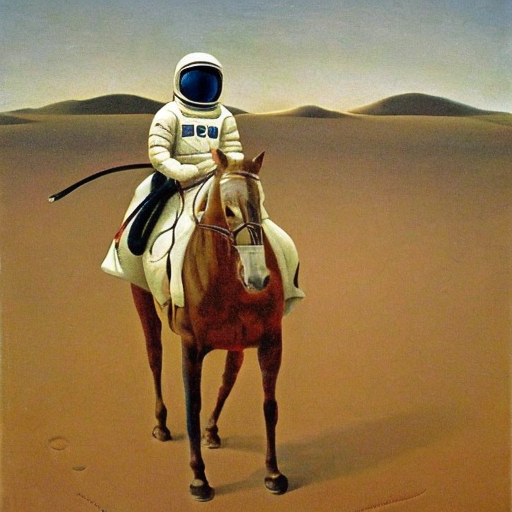

In [50]:
show_image(res[1])

torch.Size([200])

In [103]:
?? scheduler.step

In [105]:
scheduler.config.prediction_type = 'sample'

In [107]:
scheduler = LMSDiscreteScheduler(beta_start = beta_start, beta_end = beta_end, beta_schedule = "scaled_linear", num_train_timesteps = 1000, prediction_type = 'sample')

In [108]:
scheduler.config

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.00085),
            ('beta_end', 0.012),
            ('beta_schedule', 'scaled_linear'),
            ('trained_betas', None),
            ('use_karras_sigmas', False),
            ('prediction_type', 'sample'),
            ('timestep_spacing', 'linspace'),
            ('steps_offset', 0),
            ('_use_default_values',
             ['use_karras_sigmas',
              'timestep_spacing',
              'steps_offset',
              'trained_betas'])])

In [115]:
# Remove Unconditional input and check
scheduler.set_timesteps(70)
prompts = [
    'a photograph of an astronaut riding a horse',
]

# P1 - Encode the text
text_input = tokenizer(prompts, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_embeddings = text_encoder(text_input['input_ids'].to('cuda')).last_hidden_state.half()

# # P2 - Uncond Embeddings
# uncond_input = tokenizer(['']*len(prompts), padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
# uncond_embeddings = text_encoder(uncond_input['input_ids'].to('cuda')).last_hidden_state.half()

# P3 - Create noisy latents for
latents = torch.randn((len(prompts), unet.config.in_channels, height//8, width//8)).half().to('cuda')
# scheduler.set_timesteps(num_inference_steps)
latents = latents * scheduler.init_noise_sigma
inter_latents = []
for i,ts in enumerate(tqdm(scheduler.timesteps)):
    # inp = scheduler.scale_model_input(latents, ts)

    with torch.no_grad():
        pred = unet(inp, ts, encoder_hidden_states = text_embeddings).sample

    # latents = scheduler.step(pred, ts, latents).prev_sample
    if i%10 == 0:
        inter_latents.append((latents, pred))

    latents = pred


  0%|          | 0/70 [00:00<?, ?it/s]

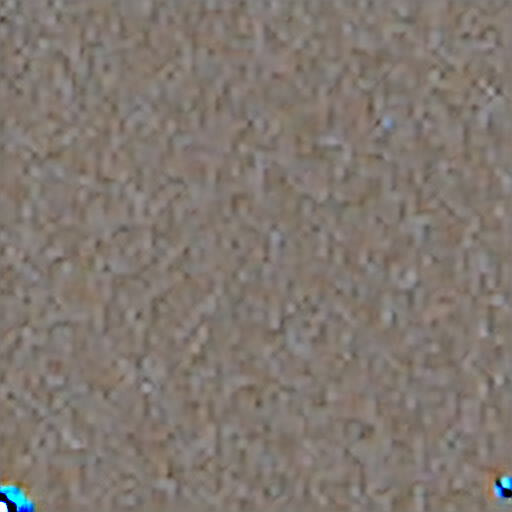

In [116]:
with torch.no_grad(): image = vae.decode(1 / 0.18215 * latents).sample
res = (image / 2 + 0.5).clamp(0, 1)
show_image(res[0])

In [73]:
def latent_to_np_image(latent):
    with torch.no_grad():
        image = vae.decode(1 / 0.18215 * latent).sample
    res = (image / 2 + 0.5).clamp(0, 1)
    img = res[0].detach().cpu().permute(1, 2, 0).numpy()
    img = (img * 255).round().astype("uint8")
    # Image.fromarray(image)
    return img


In [88]:
def show_image_grid(images, rows, cols):
    fig, axs = plt.subplots(rows, cols, figsize = (6, 15))
    for i, img_tup in enumerate(images):
        for j, img in enumerate(img_tup):
            axs[i][j].imshow(latent_to_np_image(img))
            axs[i][j].axis('off')
    fig.show()

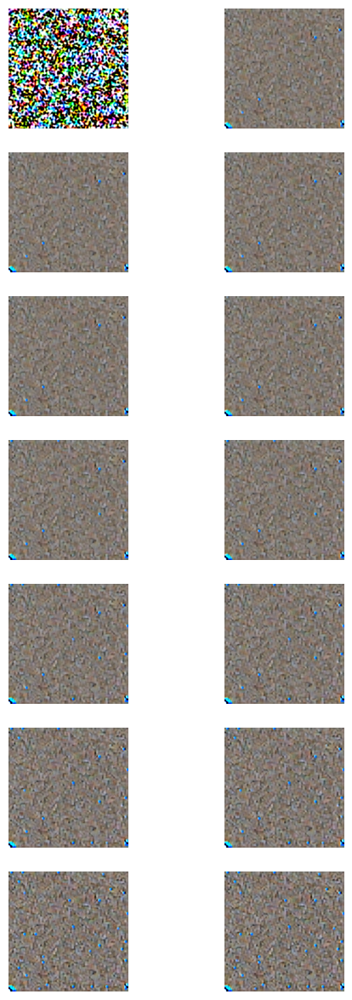

In [117]:
show_image_grid(inter_latents, len(inter_latents), 2)

## Negative Promts

In [ ]:
prompt = ['a photograph of an astronaut riding a horse']
uncond_input = ['blue'] # Negetive

In [120]:
def get_text_embeddings(prompt):
  # st()
  tokens = tokenizer(prompt, padding = 'max_length', truncation = True, max_length = tokenizer.model_max_length, return_tensors = 'pt')
  embs = text_encoder(tokens['input_ids'].to('cuda')).last_hidden_state.half()
  return embs

In [144]:
def diffusion_process(prompts, neg_prompts = [], g = 7.5, steps = 50):
  bs = len(prompts)

  # p1 - Prepare Embeddings
  text_embs = get_text_embeddings(prompts)
  uncond_input = ['']*len(prompts)

  if neg_prompts != []:
    assert len(neg_prompts) == len(prompts)
    uncond_input = neg_prompts

  uncond_embs = get_text_embeddings(uncond_input)
  embs = torch.cat([uncond_embs, text_embs])

  # Prepare Noisy latents and scale

  latents = torch.randn((bs, unet.config.in_channels, height//8, width//8)).half().to('cuda')
  scheduler.set_timesteps(steps)
  latents = latents * scheduler.init_noise_sigma
  # st()
  # Start the diffusion Process

  for i, t in enumerate(tqdm(scheduler.timesteps)):

    inp = torch.cat([latents]*2)
    inp = scheduler.scale_model_input(inp, t)

    with torch.no_grad():
      pred = unet(inp, t, encoder_hidden_states = embs).sample


    u, t = pred.chunk(2)
    pred = u + g*(t - u)
    latents = scheduler.step(pred, t, latents).prev_sample

  with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

In [146]:
def mk_samples(prompts, neg_prompts = [''], g=7.5, seed=100, steps=70):
    bs = len(prompts)
    text = get_text_embeddings(prompts)
    uncond = get_text_embeddings(neg_prompts * bs)
    emb = torch.cat([uncond, text])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * scheduler.init_noise_sigma

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 2), ts)
        with torch.no_grad(): u,t = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(2)
        pred = u + g*(t-u)
        latents = scheduler.step(pred, ts, latents).prev_sample

    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample

In [148]:
images = mk_samples(prompt, ['blue'])

<ipython-input-146-124d4a673877>:8: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

In [150]:
def mk_img(t):
    image = (t/2+0.5).clamp(0,1).detach().cpu().permute(1, 2, 0).numpy()
    return Image.fromarray((image*255).round().astype("uint8"))


In [149]:
from IPython.display import display

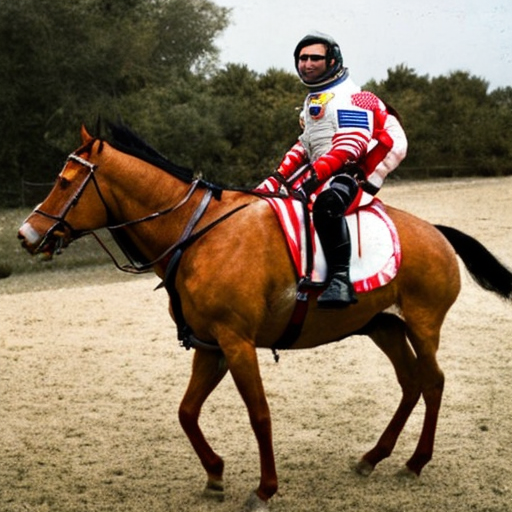

In [151]:
for img in images: display(mk_img(img))

# UNDERSTANDING WHY WE REQUIRE UNCONDITIONAL EMBEDDINGS

In [11]:
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50            # Number of denoising steps
guidance_scale = gs = 7.5                # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1



In [27]:
def create_image_from_latents(latents):

    # 1 - Scale the latents and Decode using vae
    # 2 - preprocess and conver to pil

    latents = 1 / 0.18215 * latents
    with autocast('cuda'):
        with torch.no_grad():
            image = vae.decode(latents).sample

    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images[0]

In [15]:
ps = ['A watercolor painting of an otter']

In [16]:
# s0 - Set scheduler number of steps
scheduler.set_timesteps(num_inference_steps)

# s1 - Tokenize and generate text embeddings
tokens = tokenizer(ps, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")['input_ids']
with torch.no_grad():
    text_embeddings = text_encoder(tokens.to('cuda')).last_hidden_state

In [17]:
# s2 - Create noisy latents and scale them initially
latents = torch.randn((len(ps), 4, height//8, width//8), generator = generator) # Manual Seed
latents = (latents * scheduler.init_noise_sigma).to(device)

In [18]:
# s3 - Write a diffusion loop
with autocast('cuda'):

    for i, ts in enumerate(tqdm(scheduler.timesteps)):

        latent_model_input = scheduler.scale_model_input(latents, ts)
        with torch.no_grad():
            noise_preds = unet(latent_model_input, ts, encoder_hidden_states = text_embeddings).sample

        latents = scheduler.step(noise_preds[0], ts, latents).prev_sample

100%|██████████| 50/50 [00:08<00:00,  5.88it/s]


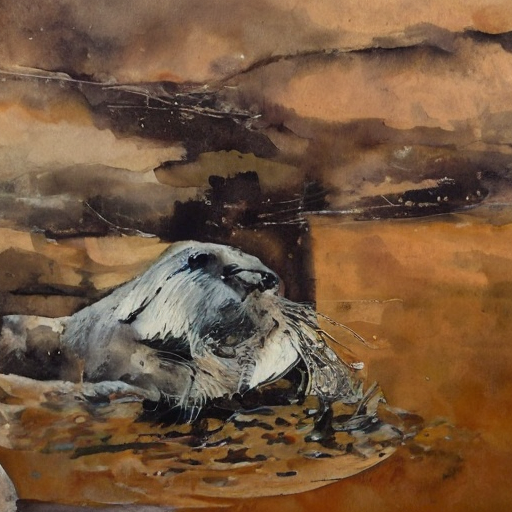

In [19]:
create_image_from_latents(latents)

WITH UNCONDITIONAL EMBEDDINGS

In [14]:
def get_text_embeddings(texts = ['']):
    tokens = tokenizer(texts, padding = "max_length", max_length = tokenizer.model_max_length, truncation = True, return_tensors = "pt")['input_ids']
    with torch.no_grad():
        embeddings = text_encoder(tokens.to(device)).last_hidden_state
    return embeddings

In [61]:
ps = ['A watercolor painting of an otter']
uncond = ['']

# 1 - Generate Text Embeddings
text_embeddings = get_text_embeddings(ps)
uncond_embeddings = get_text_embeddings(uncond)

embeddings = torch.cat([uncond_embeddings, text_embeddings], dim = 0)
embeddings.shape

torch.Size([2, 77, 768])

In [68]:
# 2 Generate Noisy Latents
latents = torch.randn((text_embeddings.shape[0], 4, 64, 64), generator = generator)
latents = (latents * scheduler.init_noise_sigma).to(device)
latents.shape

torch.Size([1, 4, 64, 64])

In [69]:
# 3 Diffusion Loop

scheduler.set_timesteps(num_inference_steps)

ls = []
nu = []
ns = []
nt = []

for (i, ts) in enumerate(tqdm(scheduler.timesteps)):

    # s1 - scale, duplicate and concatenate the latents
    # s2 - pass it through unet
    # s3 - saperate uncond and conditional ones
    # s4 - do the required subtraction for latents
    # s5 - subtract noise from the latents

    latent_model_input = torch.cat([latents]*2, dim = 0)
    latent_model_input = scheduler.scale_model_input(latent_model_input, ts)

    with autocast('cuda'):
        with torch.no_grad():

            noise = unet(latent_model_input, ts, encoder_hidden_states = embeddings).sample

        noise_uncond, noise_text = noise.chunk(2)
        noise = noise_uncond + gs * (noise_text - noise_uncond)
        latents = scheduler.step(noise, ts, latents).prev_sample

    ns.append(noise)
    nt.append(noise_text)
    nu.append(noise_uncond)
    ls.append(latents)


100%|██████████| 50/50 [00:08<00:00,  6.06it/s]


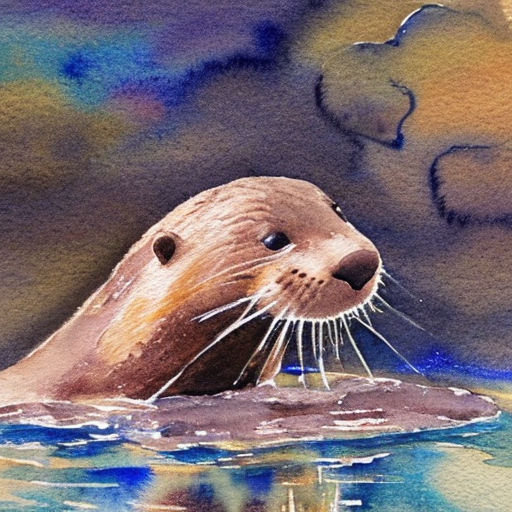

In [70]:
create_image_from_latents(latents)

In [105]:
def get_np_array_from_latents(latents):
    latents = 1 / 0.18215 * latents
    with autocast('cuda'):
        with torch.no_grad():
            image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu()[0].permute(1, 2, 0).numpy()
    return (image * 255).round().astype("uint8")

def convert_latent_list_to_np_image_array(latent_list):
    ev = []
    for i in tqdm(latent_list):
        ev.append(get_np_array_from_latents(i))
    return ev

In [106]:
latent_evolution = convert_latent_list_to_np_image_array(ls)

100%|██████████| 50/50 [00:12<00:00,  3.87it/s]


In [107]:
from matplotlib import rc
rc('animation', html='jshtml')

In [108]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation


fig, ax = plt.subplots()
frames = [[ax.imshow(latent_evolution[i])] for i in range(len(latent_evolution))]

ani = animation.ArtistAnimation(fig, frames)
ani

In [10]:
?? scheduler.step

## With similar unconditional prompt as the primary prompt

In [18]:
p = 'An astronaut on the moon'
up = 'a dog sitting on the moon'

scheduler.set_timesteps(num_inference_steps)

In [15]:
#1. Get text embeddings
text_emb = get_text_embeddings([p])
uncond_emb = get_text_embeddings([up])

In [17]:
text_emb.shape, uncond_emb.shape

(torch.Size([1, 77, 768]), torch.Size([1, 77, 768]))

In [20]:
embs = torch.cat([uncond_emb, text_emb])

In [25]:
# Create Latents and scale them
latents = torch.randn((1, 4, 64, 64), generator = generator)
latents = (latents * scheduler.init_noise_sigma).to(device)

In [26]:
# Diffusion Loop

for (i, ts) in enumerate(tqdm(scheduler.timesteps)):

    # duplicate the latents and scale them
    latent_model_input = torch.cat([latents]*2)
    latent_model_input = scheduler.scale_model_input(latent_model_input, ts)

    # predict the noise
    with autocast('cuda'):
        with torch.no_grad():
            noise = unet(latent_model_input, ts, encoder_hidden_states = embs).sample

    # do weighted sum of noise
    nu, nt = noise.chunk(2)
    np = nu + gs*(nt - nu)

    # scheduler.step
    latents = scheduler.step(np, ts, latents).prev_sample


100%|██████████| 50/50 [00:07<00:00,  6.50it/s]


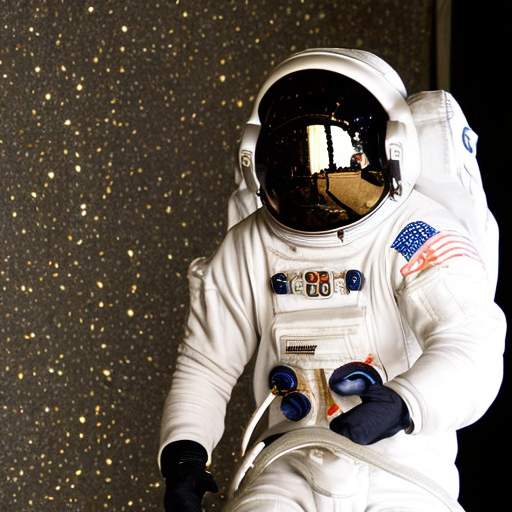

In [28]:
create_image_from_latents(latents)

In [47]:
def complete_diffusion_process(p = '', up = ''):

    scheduler.set_timesteps(num_inference_steps)

    #1
    text_emb = get_text_embeddings([p])
    uncond_emb = get_text_embeddings([up])

    embs = torch.cat([uncond_emb, text_emb])

    #2
    latents = torch.randn((1, 4, 64, 64), generator = generator)
    latents = (latents * scheduler.init_noise_sigma).to(device)

    #3
    for (i, ts) in enumerate(tqdm(scheduler.timesteps)):

        # duplicate the latents and scale them
        latent_model_input = torch.cat([latents]*2)


        # predict the noise
        with autocast('cuda'):

            latent_model_input = scheduler.scale_model_input(latent_model_input, ts)

            with torch.no_grad():
                noise = unet(latent_model_input, ts, encoder_hidden_states = embs).sample

            # do weighted sum of noise
            nu, nt = noise.chunk(2)
            np = nu + gs*(nt - nu)

            # scheduler.step
            latents = scheduler.step(np[0], ts, latents).prev_sample

    return latents

100%|██████████| 50/50 [00:07<00:00,  6.32it/s]


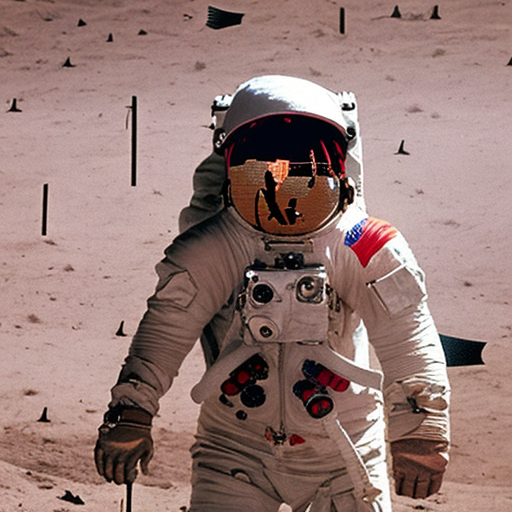

In [32]:
p = 'An astronaut on the moon'
up = 'the moon'

l_1 = complete_diffusion_process(p, up)
create_image_from_latents(l_1)

100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


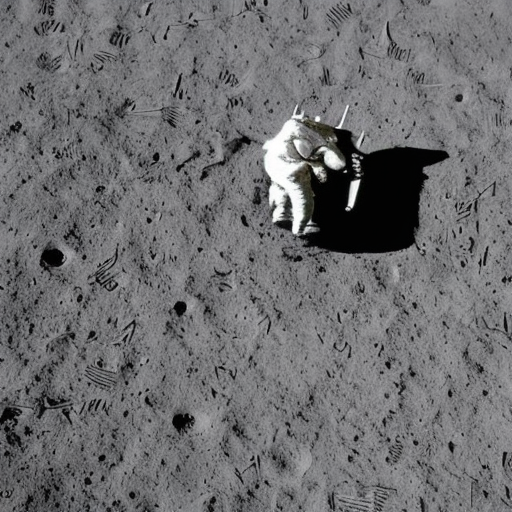

In [33]:
p = 'An astronaut on the moon'
up = 'An astronaut'

l_1 = complete_diffusion_process(p, up)
create_image_from_latents(l_1)

100%|██████████| 50/50 [00:08<00:00,  6.21it/s]


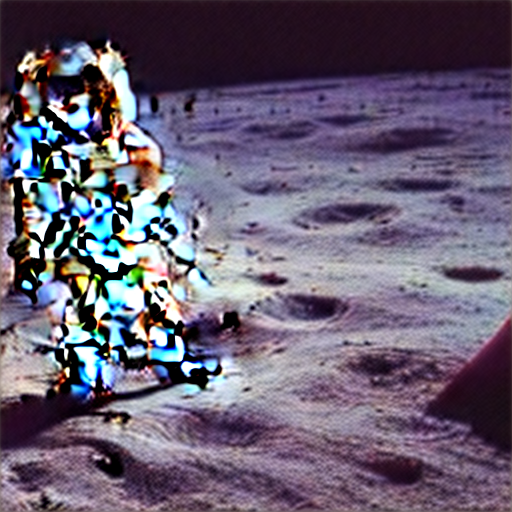

In [34]:
p = 'An astronaut on the moon'
up = 'A pumped up stallion'

l_3 = complete_diffusion_process(p, up)
create_image_from_latents(l_3)

100%|██████████| 50/50 [00:09<00:00,  5.41it/s]


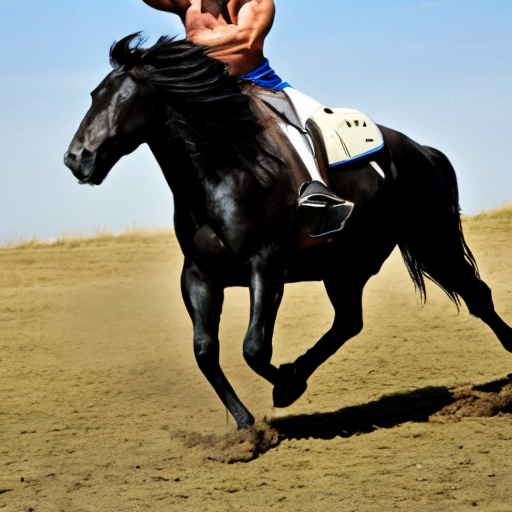

In [35]:
p = 'A pumped up stallion'
up = ''

l_4 = complete_diffusion_process(p, up)
create_image_from_latents(l_4)

100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


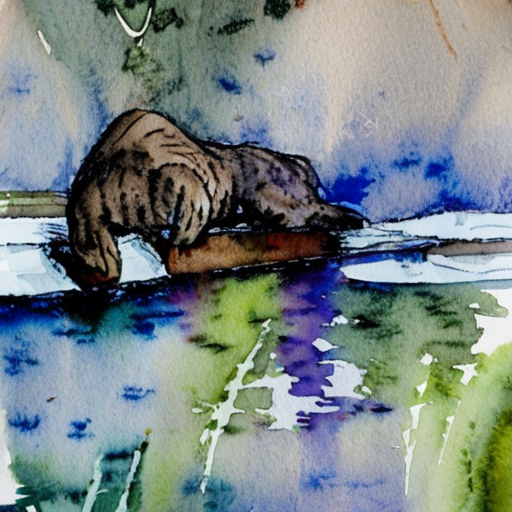

In [36]:
p = 'A watercolor painting of an otter'
up = 'An oil paining of an otter'

l_4 = complete_diffusion_process(p, up)
create_image_from_latents(l_4)

100%|██████████| 50/50 [00:08<00:00,  6.20it/s]


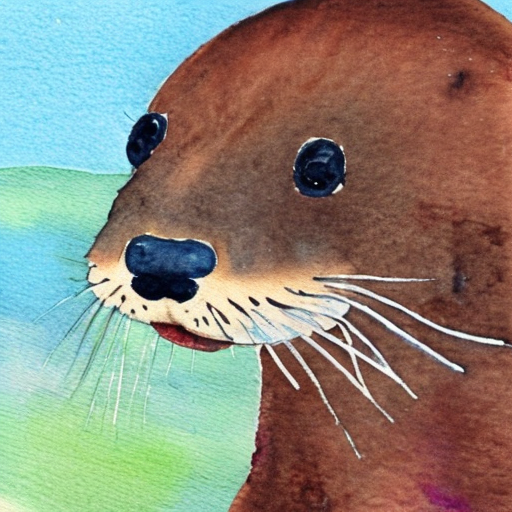

In [37]:
p = 'A watercolor painting of an otter'
up = 'lorem ipsum dolor sit amet'

l_4 = complete_diffusion_process(p, up)
create_image_from_latents(l_4)

In [59]:
def diffusion_process_with_variable_gs(p = '', up = '', iters = 50):
    scheduler.set_timesteps(iters)

    u_gs = 7.5

    #1
    text_emb = get_text_embeddings([p])
    uncond_emb = get_text_embeddings([up])

    embs = torch.cat([uncond_emb, text_emb])

    #2
    latents = torch.randn((1, 4, 64, 64), generator = generator)
    latents = (latents * scheduler.init_noise_sigma).to(device)

    #3
    for (i, ts) in enumerate(tqdm(scheduler.timesteps)):

        # duplicate the latents and scale them
        latent_model_input = torch.cat([latents]*2)


        # predict the noise
        with autocast('cuda'):
            latent_model_input = scheduler.scale_model_input(latent_model_input, ts)
            with torch.no_grad():
                noise = unet(latent_model_input, ts, encoder_hidden_states = embs).sample

            # do weighted sum of noise
            nu, nt = noise.chunk(2)

            if i > 10:
                u_gs = u_gs/(i+1)

            np = nu + u_gs*(nt - nu)

            # scheduler.step
            latents = scheduler.step(np[0], ts, latents).prev_sample

    return latents

100%|██████████| 30/30 [00:04<00:00,  6.17it/s]


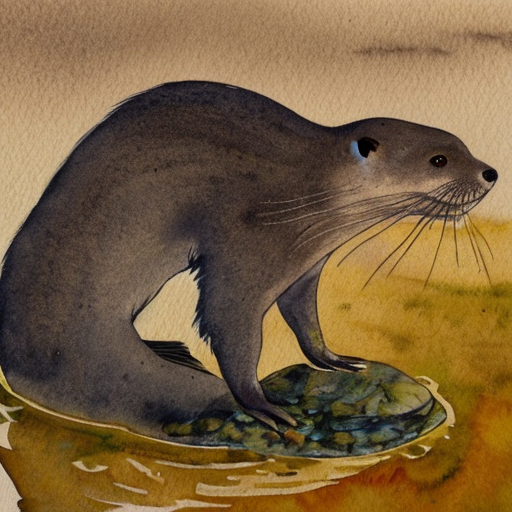

In [62]:
p = 'A watercolor painting of an otter'
up = ''
generator = torch.manual_seed(32)

l_4 = complete_diffusion_process(p, up)
create_image_from_latents(l_4)

100%|██████████| 30/30 [00:04<00:00,  6.61it/s]


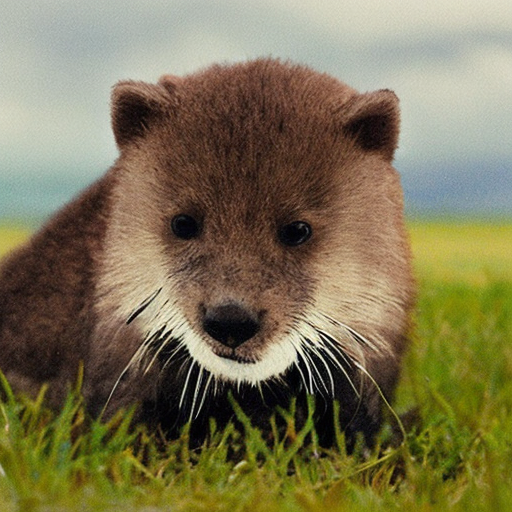

In [63]:
p = 'A watercolor painting of an otter'
up = "solar system with 9 planets"
generator = torch.manual_seed(32)

l_6 = diffusion_process_with_variable_gs(p, up, 30)
create_image_from_latents(l_6)

100%|██████████| 50/50 [00:07<00:00,  6.51it/s]


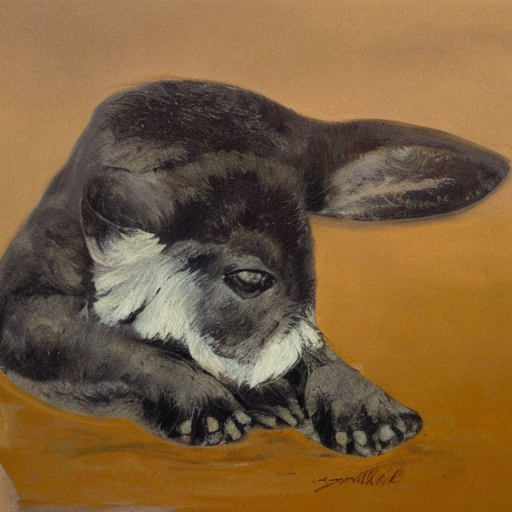

In [65]:
p = 'A watercolor painting of an otter'
up = ""
generator = torch.manual_seed(32)

l_6 = diffusion_process_with_variable_gs(p, up, 50)
create_image_from_latents(l_6)

In [66]:
def diffusion_process_with_variable_gs_v2(p = '', up = '', iters = 50):
    scheduler.set_timesteps(iters)
    gs = 7.5

    #1
    text_emb = get_text_embeddings([p])
    uncond_emb = get_text_embeddings([up])

    embs = torch.cat([uncond_emb, text_emb])

    #2
    latents = torch.randn((1, 4, 64, 64), generator = generator)
    latents = (latents * scheduler.init_noise_sigma).to(device)

    #3
    for (i, ts) in enumerate(tqdm(scheduler.timesteps)):

        # duplicate the latents and scale them
        latent_model_input = torch.cat([latents]*2)


        # predict the noise
        with autocast('cuda'):
            latent_model_input = scheduler.scale_model_input(latent_model_input, ts)
            with torch.no_grad():
                noise = unet(latent_model_input, ts, encoder_hidden_states = embs).sample

            # do weighted sum of noise
            nu, nt = noise.chunk(2)
            u_gs = gs
            if i > 10:
                u_gs = u_gs/(i)

            np = nu + u_gs*(nt - nu)

            # scheduler.step
            latents = scheduler.step(np[0], ts, latents).prev_sample

    return latents

100%|██████████| 50/50 [00:07<00:00,  6.53it/s]


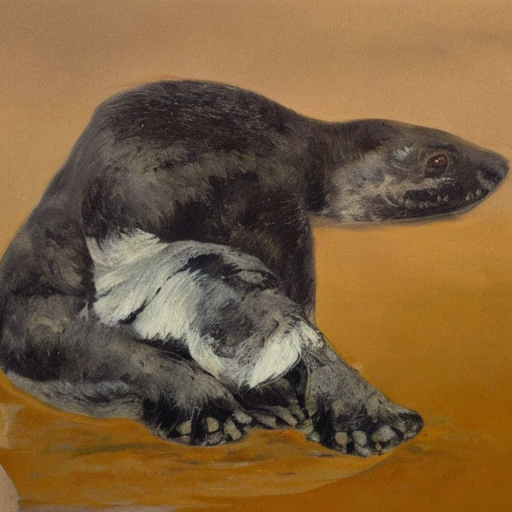

In [67]:
p = 'A watercolor painting of an otter'
up = ""
generator = torch.manual_seed(32)

l_6 = diffusion_process_with_variable_gs_v2(p, up, 50)
create_image_from_latents(l_6)

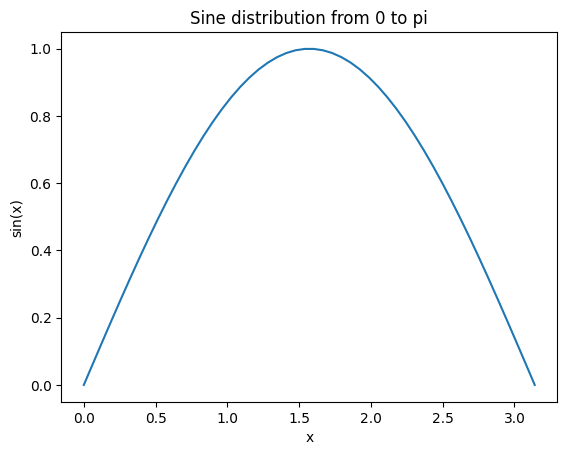

In [70]:
x = torch.linspace(0, 3.14159, 50)

# Compute sine of each value
y = torch.sin(x)

# Plot the sine wave
plt.plot(x.numpy(), y.numpy())
plt.title("Sine distribution from 0 to pi")
plt.xlabel("x")
plt.ylabel("sin(x)")
plt.show()


In [72]:
def diffusion_process_with_variable_gs_v3(p = '', up = '', iters = 50):
    scheduler.set_timesteps(iters)
    x = torch.linspace(0, 2.8, iters)
    gss = torch.sin(x)

    #1
    text_emb = get_text_embeddings([p])
    uncond_emb = get_text_embeddings([up])

    embs = torch.cat([uncond_emb, text_emb])

    #2
    latents = torch.randn((1, 4, 64, 64), generator = generator)
    latents = (latents * scheduler.init_noise_sigma).to(device)

    #3
    for (i, ts) in enumerate(tqdm(scheduler.timesteps)):

        # duplicate the latents and scale them
        latent_model_input = torch.cat([latents]*2)


        # predict the noise
        with autocast('cuda'):
            latent_model_input = scheduler.scale_model_input(latent_model_input, ts)
            with torch.no_grad():
                noise = unet(latent_model_input, ts, encoder_hidden_states = embs).sample

            # do weighted sum of noise
            nu, nt = noise.chunk(2)
            u_gs = gss[i]

            np = nu + u_gs*(nt - nu)

            # scheduler.step
            latents = scheduler.step(np[0], ts, latents).prev_sample

    return latents

100%|██████████| 50/50 [00:07<00:00,  6.72it/s]


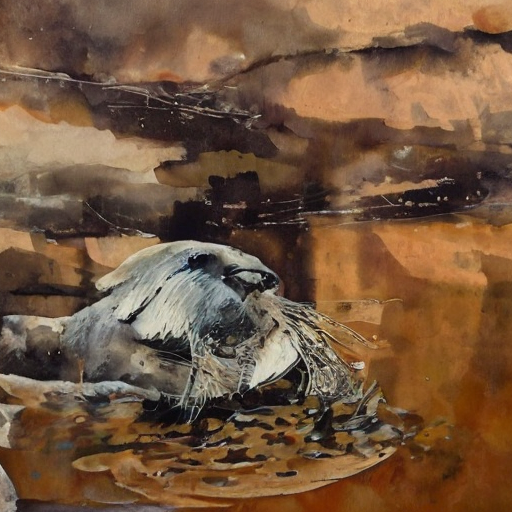

In [74]:
p = 'A watercolor painting of an otter'
up = ""
generator = torch.manual_seed(32)

l_6 = diffusion_process_with_variable_gs_v3(p, up, 50)
create_image_from_latents(l_6)

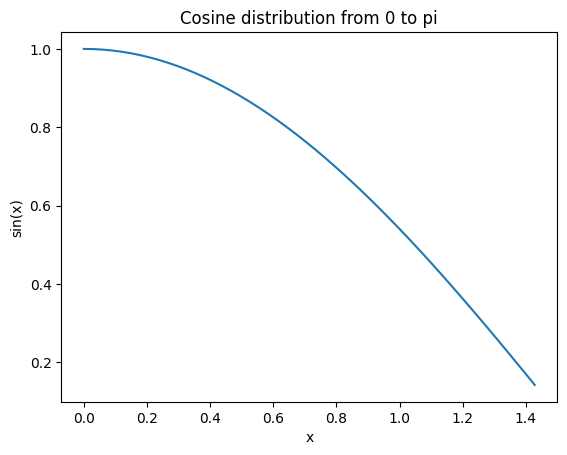

In [78]:
x = torch.linspace(0, (3.14159/2.2), 50)

# Compute sine of each value
y = torch.cos(x)

# Plot the sine wave
plt.plot(x.numpy(), y.numpy())
plt.title("Cosine distribution from 0 to pi")
plt.xlabel("x")
plt.ylabel("sin(x)")
plt.show()


In [79]:
def diffusion_process_with_variable_gs_v4(p = '', up = '', iters = 50):
    scheduler.set_timesteps(iters)
    x = torch.linspace(0, (3.14159/2.2), iters)
    gss = torch.cos(x)

    #1
    text_emb = get_text_embeddings([p])
    uncond_emb = get_text_embeddings([up])

    embs = torch.cat([uncond_emb, text_emb])

    #2
    latents = torch.randn((1, 4, 64, 64), generator = generator)
    latents = (latents * scheduler.init_noise_sigma).to(device)

    #3
    for (i, ts) in enumerate(tqdm(scheduler.timesteps)):

        # duplicate the latents and scale them
        latent_model_input = torch.cat([latents]*2)


        # predict the noise
        with autocast('cuda'):
            latent_model_input = scheduler.scale_model_input(latent_model_input, ts)
            with torch.no_grad():
                noise = unet(latent_model_input, ts, encoder_hidden_states = embs).sample

            # do weighted sum of noise
            nu, nt = noise.chunk(2)
            u_gs = gss[i]

            np = nu + u_gs*(nt - nu)

            # scheduler.step
            latents = scheduler.step(np[0], ts, latents).prev_sample

    return latents

100%|██████████| 50/50 [00:07<00:00,  6.45it/s]


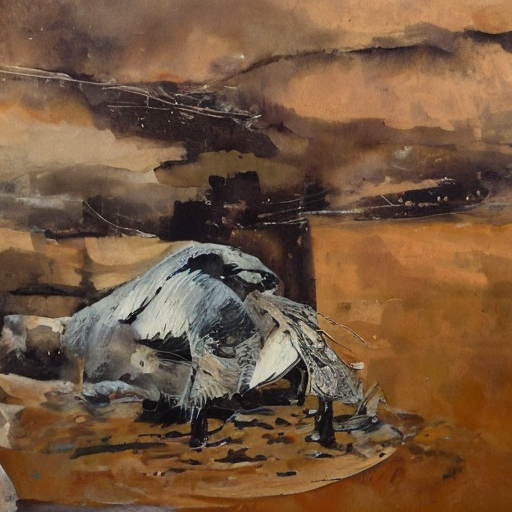

In [81]:
p = 'A watercolor painting of an otter'
up = ""
generator = torch.manual_seed(32)

l_7 = diffusion_process_with_variable_gs_v4(p, up, 50)
create_image_from_latents(l_7)